# Text Reliability with Gemini 2.5 Image Nano Banana

Adapted from [Nano Banana Recipes](https://github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/nano-banana/nano_banana_recipes.ipynb) and [Yan Sun's LLM Text Readability Guide](https://colab.sandbox.google.com/drive/12UOva2wmZ9U0MfspQR_VmR5NryH2jbKt?usp=chrome_ntp#scrollTo=f0cc0f48513b)

In [ ]:
# Copyright 2025 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Setup Environment

Install Required Libraries and Import

In [1]:
%pip install --upgrade --quiet google-genai pillow

In [2]:
import sys
import io
import os

from IPython.display import display
from PIL import Image
from google.genai import types
from google import genai
from io import BytesIO
from google.genai.types import GenerateContentResponse

if "google.colab" in sys.modules:
    from google.colab import auth

    auth.authenticate_user()

Colab specific authentication - if needed

### Set Google Cloud project
Ensure that you have an [existing Google Cloud project](https://cloud.google.com/vertex-ai/docs/start/cloud-environment) and enable the [Vertex AI API](https://www.google.com/url?q=https%3A%2F%2Fconsole.cloud.google.com%2Fflows%2Fenableapi%3Fapiid%3Daiplatform.googleapis.com)
.


In [3]:
# Use the environment variable if the user doesn't provide Project ID.

PROJECT_ID = "meera-demos"  # @param {type: "string", placeholder: "[your-project-id]", isTemplate: true}  # fmt: skip
if not PROJECT_ID or PROJECT_ID == "[your-project-id]":
    PROJECT_ID = str(os.environ.get("GOOGLE_CLOUD_PROJECT"))

LOCATION = os.environ.get("GOOGLE_CLOUD_REGION", "us-central1")

client = genai.Client(vertexai=True, project=PROJECT_ID, location=LOCATION)

## Define Helper Functions

For use reading images, displaying images, and calling models throughout the notebook.

In [4]:
# --- Model and Generation Configuration ---
MODEL_NAME = "gemini-2.5-flash-image"
GENERATION_CONFIG = types.GenerateContentConfig(
    temperature=1,
    top_p=0.95,
    max_output_tokens=32768,
    response_modalities=["TEXT", "IMAGE"],
)


def create_blank_canvas(
    aspect_ratio: str = "1:1",
    width: int | None = None,
    height: int | None = None,
    color: str = "white",
) -> types.Part:
    """Creates a blank image canvas with a specified aspect ratio or custom dimensions."""
    aspect_ratios = {
        "1:1": (1024, 1024),
        "3:4": (768, 1024),
        "4:3": (1024, 768),
        "9:16": (720, 1280),
        "16:9": (1280, 720),
    }

    if aspect_ratio == "custom":
        if not all([width, height]):
            raise ValueError("Width and height are required for custom aspect ratio.")
        final_width, final_height = width, height
    elif aspect_ratio in aspect_ratios:
        final_width, final_height = aspect_ratios[aspect_ratio]
    else:
        raise ValueError(f"Unsupported aspect ratio: {aspect_ratio}")

    image = Image.new("RGB", (final_width, final_height), color)
    buffer = io.BytesIO()
    image.save(buffer, format="PNG")
    return types.Part.from_bytes(data=buffer.getvalue(), mime_type="image/png")


def generate_and_display_image(contents: list) -> GenerateContentResponse: # <--- CHANGE 1: Change 'None' to 'GenerateContentResponse'
    """Generates an image using Gemini and displays it."""
    response = client.models.generate_content(
        model=MODEL_NAME,
        contents=contents,
        config=GENERATION_CONFIG,
    )

    if response.candidates and response.candidates[0].content.parts:
        for part in response.candidates[0].content.parts:
            if part.inline_data and part.inline_data.data:
                display(Image.open(io.BytesIO(part.inline_data.data)))
                break #
    else:
        print("No image was generated.")
    return response


def load_local_image_part(file_path: str) -> types.Part:
    """
    Reads a local image file and converts it into a google.genai.types.Part object.

    Returns:
        A types.Part object containing the image data and MIME type.
    """
    # Determine MIME type based on extension
    file_extension = os.path.splitext(file_path)[1].lower()

    if file_extension in ('.jpg', '.jpeg'):
        mime_type = 'image/jpeg'
    elif file_extension == '.png':
        mime_type = 'image/png'
    else:
        # Defaults to JPEG if extension is missing/unknown, but better to enforce check
        mime_type = 'image/jpeg'

    # Read the local file's raw content (bytes)
    with open(file_path, 'rb') as f:
        image_data = f.read()

    # Package the bytes into the required Part object
    return types.Part.from_bytes(data=image_data, mime_type=mime_type)

In [23]:
def save_generated_image(response: GenerateContentResponse, output_filename: str):
    """Saves a generated image by searching for the image part within the response."""

    image_bytes = None

    if response.candidates and response.candidates[0].content.parts:
        for part in response.candidates[0].content.parts:
            if part.inline_data and part.inline_data.data:
                image_bytes = part.inline_data.data
                break

    if image_bytes:
        try:
            image = Image.open(io.BytesIO(image_bytes))
            image.save(output_filename)
            print(f"Image successfully saved as: {output_filename}")
        except Exception as e:
            print(f"An unexpected error occurred during saving: {e}")
    else:
        print("Error: The response did not contain inline image data.")

## Generate Images from Text Prompt

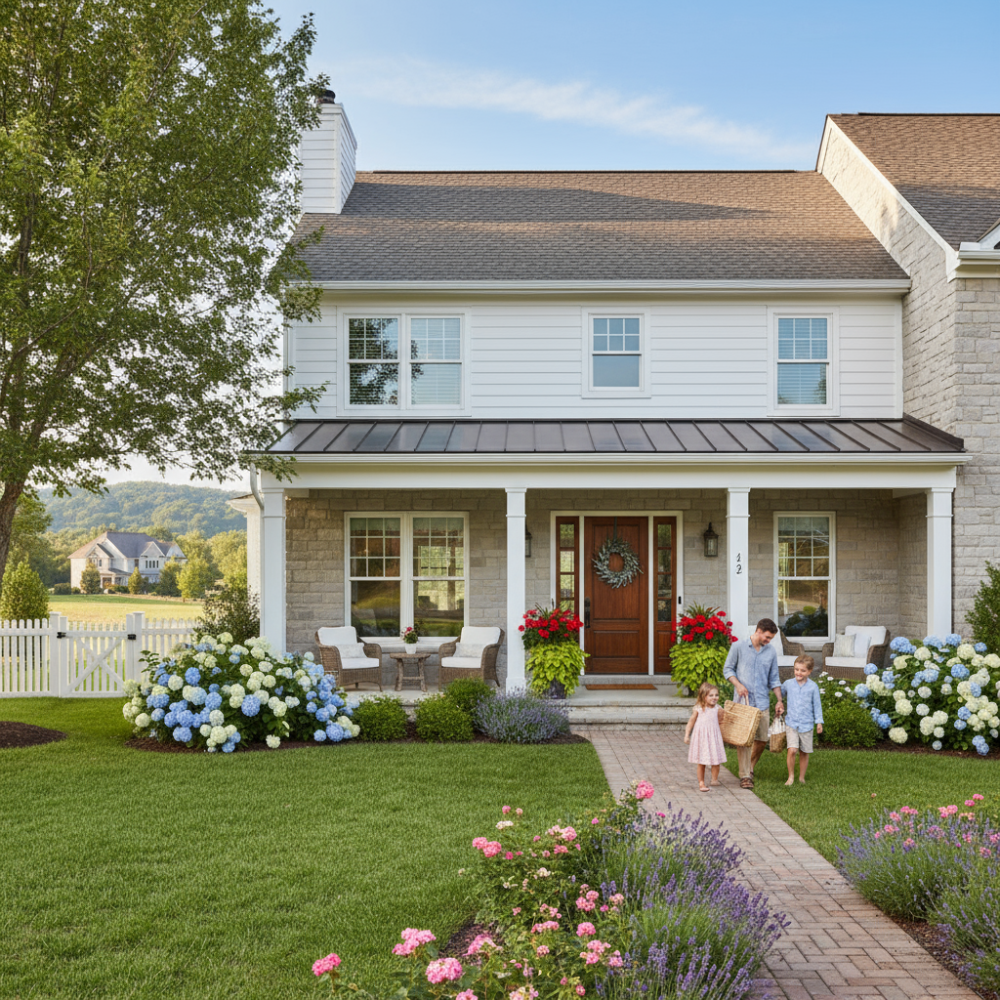

In [6]:
prompt = "An idyllic suburban home, fit for a home goods marketing campaign"
contents = [types.Content(role="user", parts=[types.Part.from_text(text=prompt)])]


api_response = generate_and_display_image(contents)

## Images with Text

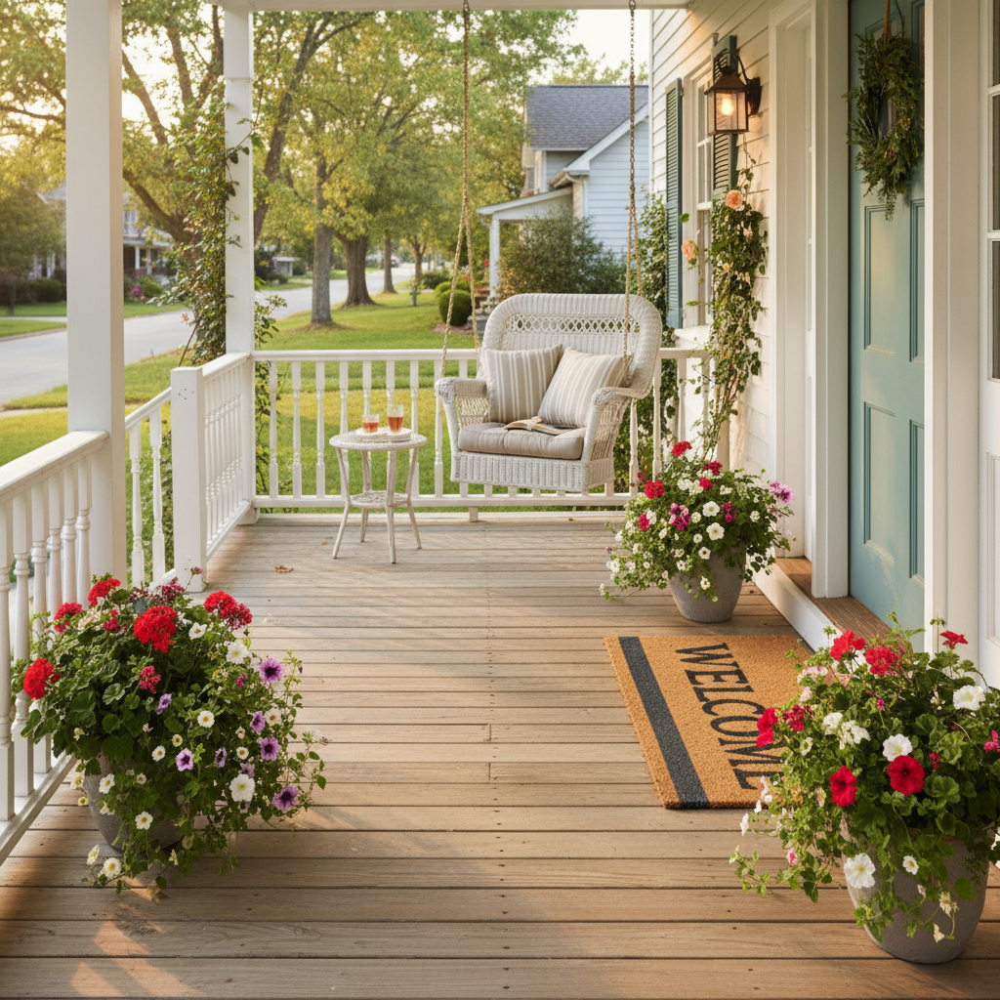

In [7]:
prompt = """Generate a hyper-realistic image of an idyllic suburban porch with a doormat that reads "WELCOME" in front of the door. The door mat should have the word "WELCOME" clearly visible. The text should be in US English."""

contents = [types.Content(role="user", parts=[types.Part.from_text(text=prompt)])]

api_response = generate_and_display_image(contents)

## Generate from Reference Images

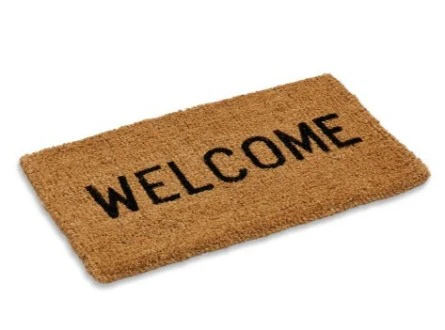

In [8]:
# Show reference image, uploaded in local environment

image_to_edit_path = "doormat_solo.png"
source_image = load_local_image_part(image_to_edit_path)
display(Image.open(io.BytesIO(source_image.inline_data.data)))

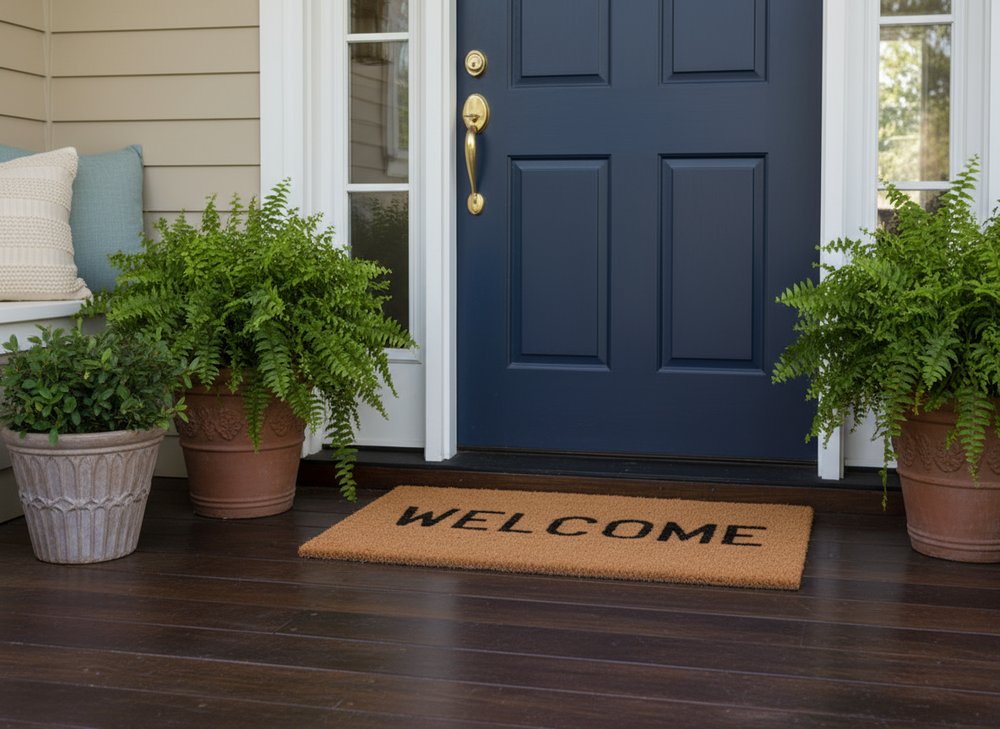

✅ Image successfully saved as: doormat_scene_navy.png


In [10]:
# Generate promotional image using reference product image

image_to_edit_path = "doormat_solo.png"

source_image = load_local_image_part(image_to_edit_path)

prompt = """Place the provided doormat image onto a beautifully styled, high-end front porch. The background should feature a light gray or navy-blue front door, hanging ferns in decorative pots, and polished wooden floorboards. The lighting should be soft, warm, and highly professional, suitable for a marketing advertisement for home goods."""

contents = [
    types.Content(role="user", parts=[source_image, types.Part.from_text(text=prompt)])
]

api_response = generate_and_display_image(contents)
save_generated_image(api_response, "doormat_scene_navy.png")

## Edit Images

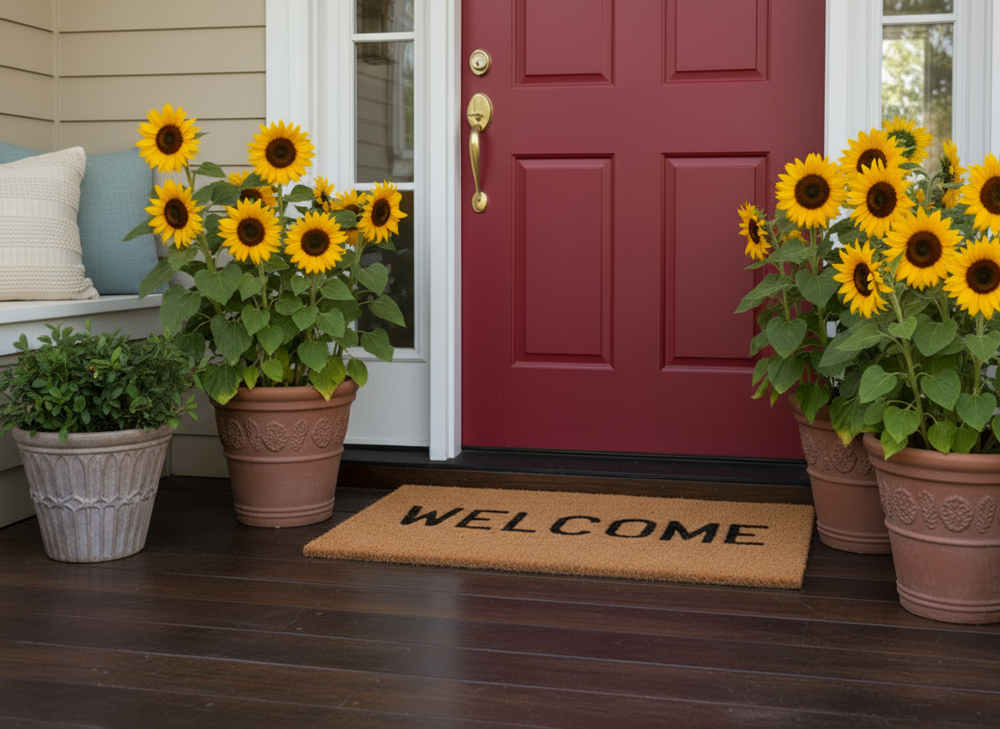

In [12]:
# Original Image, change door color to red

image_to_edit_path = "doormat_scene_navy.png"
source_image = load_local_image_part(image_to_edit_path)

prompt = """Please change the color of the door in the in the image to red. Replace the decorative plants with sunflowers. Ensure the additions look natural and blend seamlessly with the original image."""

contents = [
    types.Content(role="user", parts=[source_image, types.Part.from_text(text=prompt)])
]

api_response = generate_and_display_image(contents)

## Gibberish Detection

In [15]:
%pip install --upgrade --quiet google-cloud-vision gibberish-detector

In [16]:
!curl -O https://raw.githubusercontent.com/domanchi/gibberish-detector/master/gibberish_detector/big.txt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    14  100    14    0     0     70      0 --:--:-- --:--:-- --:--:--    70


In [17]:
!gibberish-detector train big.txt > gibberish-detector.model

In [18]:
from google.cloud import vision
from gibberish_detector import detector
from google.auth import default

DESIRED_PROJECT_ID = "meera-demos"

def is_gibberish_word(text, detector_model_path='gibberish-detector.model'):
    """
    Checks if a given string is gibberish using a trained model.

    Args:
        text (str): The text to analyze.
        detector_model_path (str): The path to the trained gibberish detector model.

    Returns:
        bool: True if the text is detected as gibberish, False otherwise.
    """
    # Create the gibberish detector from the trained model
    d = detector.create_from_model(detector_model_path)
    return d.is_gibberish(text)

def analyze_image_for_gibberish(image_path, gibberish_threshold=0.5):
    """
    Combines OCR and gibberish detection to evaluate text in an image.

    Args:
        image_path (str): The path to the image file.
        gibberish_threshold (float): The ratio of gibberish words to total words
                                    that will trigger the "gibberish" flag.

    Returns:
        tuple: A tuple containing (is_gibberish, gibberish_ratio, extracted_text).
    """
    credentials, project_id = default()
    client = vision.ImageAnnotatorClient(
        credentials=credentials,
        client_options={"quota_project_id": DESIRED_PROJECT_ID}
    )
    with io.open(image_path, 'rb') as image_file:
        content = image_file.read()

    image = vision.Image(content=content)
    response = client.text_detection(image=image)
    text_annotations = response.text_annotations

    if not text_annotations:
        return True, 1.0, "No text found in image."

    extracted_text = text_annotations[0].description
    words = [word for word in extracted_text.split() if word.isalpha()]

    if not words:
        # If no alphabetic words are found, consider it gibberish
        return True, 1.0, extracted_text

    gibberish_words_count = 0
    for word in words:
        if is_gibberish_word(word.lower()):
            gibberish_words_count += 1

    gibberish_ratio = gibberish_words_count / len(words)
    is_gibberish = gibberish_ratio >= gibberish_threshold

    return is_gibberish, gibberish_ratio, extracted_text

In [19]:
# Example Usage

image_file = 'welcome-home.png'

is_gibberish, gibberish_ratio, extracted_text = analyze_image_for_gibberish(image_file, gibberish_threshold=0.5)

print(f"Extracted Text:\n---\n{extracted_text}\n---\n")

if is_gibberish:
    print(f"The text is likely gibberish. (Gibberish Word Ratio: {gibberish_ratio:.2f})")
else:
    print(f"The text is likely NOT gibberish. (Gibberish Word Ratio: {gibberish_ratio:.2f})")

Extracted Text:
---
WELCOME
HOME
---

The text is likely NOT gibberish. (Gibberish Word Ratio: 0.00)


1. Generating and displaying image...


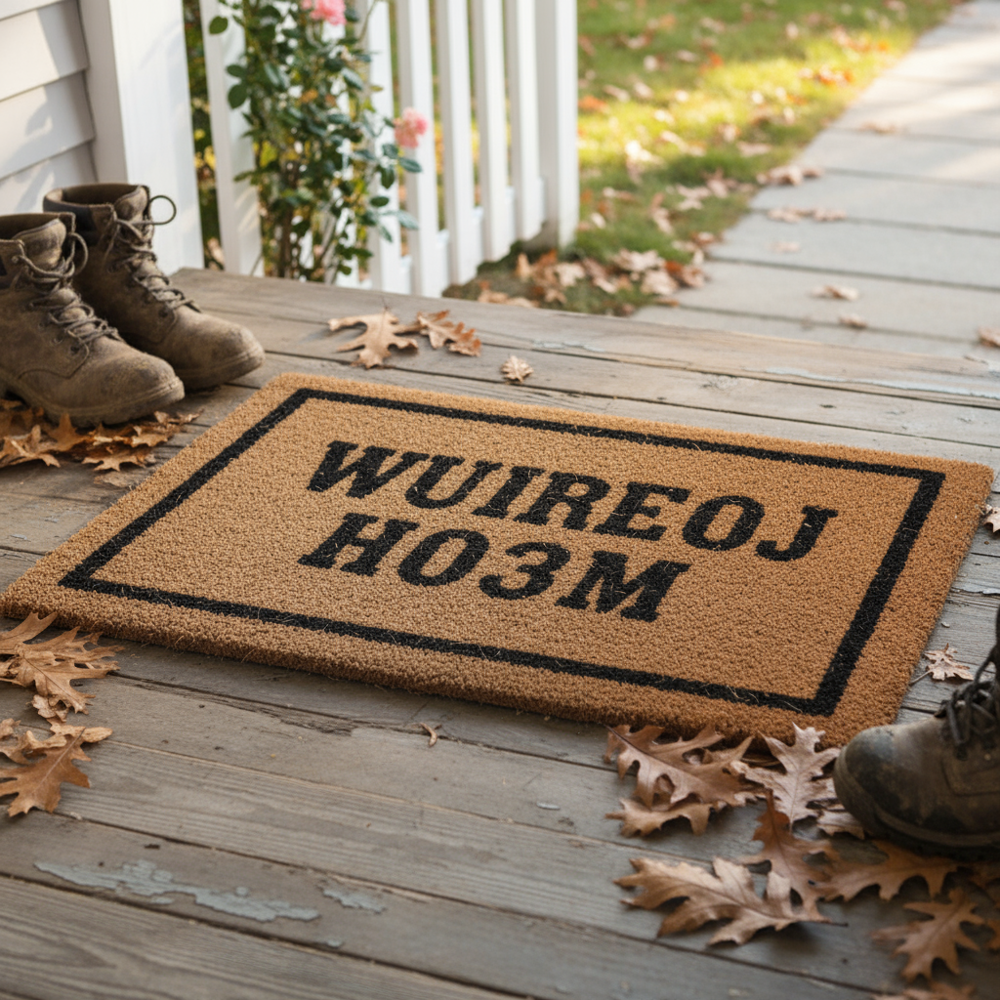

2. Saving generated image...
✅ Image successfully saved as: misspelled_mat2.png
Done.


In [26]:
# Intentional gibberish example - save the image

prompt = """Generate a realistic photo of a mat with the nonsensical gibberish text 'WUIREOJ HO3M' printed on it, sitting on a front porch
"""

contents = [
    types.Content(role="user", parts=[types.Part.from_text(text=prompt)])
]

print("1. Generating and displaying image...")

api_response = generate_and_display_image(contents)

print("2. Saving generated image...")

save_generated_image(api_response, "misspelled_mat.png")

print("Done.")

In [27]:
# Do gibberish check on intentionally created image

image_file = 'misspelled_mat.png'

is_gibberish, gibberish_ratio, extracted_text = analyze_image_for_gibberish(image_file, gibberish_threshold=0.5)

print(f"Extracted Text:\n---\n{extracted_text}\n---\n")

if is_gibberish:
    print(f"The text is likely gibberish. (Gibberish Word Ratio: {gibberish_ratio:.2f})")
else:
    print(f"The text is likely NOT gibberish. (Gibberish Word Ratio: {gibberish_ratio:.2f})")

Extracted Text:
---
WUIREOJ
H03M
---

The text is likely NOT gibberish. (Gibberish Word Ratio: 0.00)


## Aspect Ratio Control

Generating image with 16:9 aspect ratio...


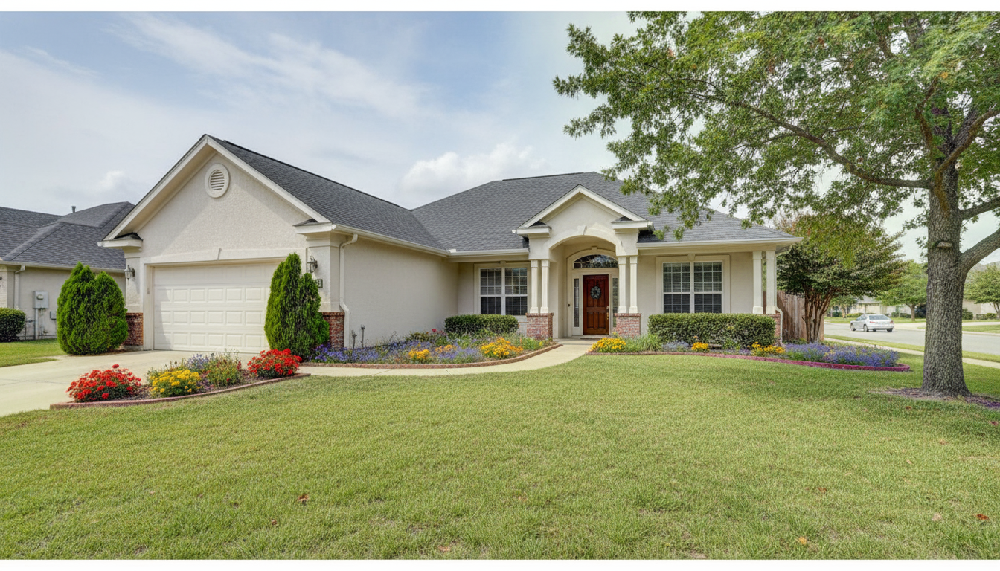

In [35]:
canvas = create_blank_canvas(aspect_ratio="16:9")
prompt = """A wide angle shot of a suburban home. Render this scene on the provided canvas to match its 16:9 aspect ratio."""
contents = [
    types.Content(role="user", parts=[canvas, types.Part.from_text(text=prompt)])
]

print("Generating image with 16:9 aspect ratio...")
api_response = generate_and_display_image(contents)
